Imports

In [1]:
import vectorbt as vbt
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from alpaca.data.historical import StockHistoricalDataClient
from alpaca.data.requests import StockBarsRequest
from alpaca.data.timeframe import TimeFrame, TimeFrameUnit
from alpaca.data.enums import DataFeed
from sklearn.ensemble import RandomForestClassifier
from copulas.multivariate import GaussianMultivariate
from sklearn.preprocessing import MinMaxScaler
import seaborn as sns
from scipy.stats import zscore
import statsmodels.api as sm
from scipy.stats import norm
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler


Data

In [2]:
# Decode to read Alpaca API credentials from 'local.ini'
import configparser
config = configparser.ConfigParser()
config.read('local.ini')
API_KEY = None
API_SECRET = None
API_KEY    = config.get('Alpaca-Paper-Trading', 'API_KEY', fallback=API_KEY)
API_SECRET = config.get('Alpaca-Paper-Trading', 'API_SECRET', fallback=API_SECRET)

# Initialize Alpaca data client with API credentials
data_client = StockHistoricalDataClient(API_KEY, API_SECRET)


In [3]:
# Define stock parameters
stock_params = {
    "META": ("2020-01-01", "2025-01-01"),  # F
    "AAPL": ("2020-01-01", "2025-01-01"),  # A
    "AMZN": ("2020-01-01", "2025-01-01"),  # A
    "NFLX": ("2020-01-01", "2025-01-01"),  # N
    "GOOG": ("2020-01-01", "2025-01-01"),  # G
    "MSFT": ("2020-01-01", "2025-01-01"),
    "NVDA": ("2020-01-01", "2025-01-01"),
}
# Note: Any stocks or asset can be added above, the whole script is desinged to be modular and scalable

# Loop through and fetch data
for symbol, (start, end) in stock_params.items():
    bars_req = StockBarsRequest(
        symbol_or_symbols=[symbol],
        timeframe=TimeFrame.Day,
        start=start,
        end=end,
        feed=DataFeed.IEX
    )
    # Saved in individual CSV files
    bars_result = data_client.get_stock_bars(bars_req)
    bars_result.df.to_csv(f"case_data/{symbol}.csv", index=True)


Values with |zscore| > 6: 11


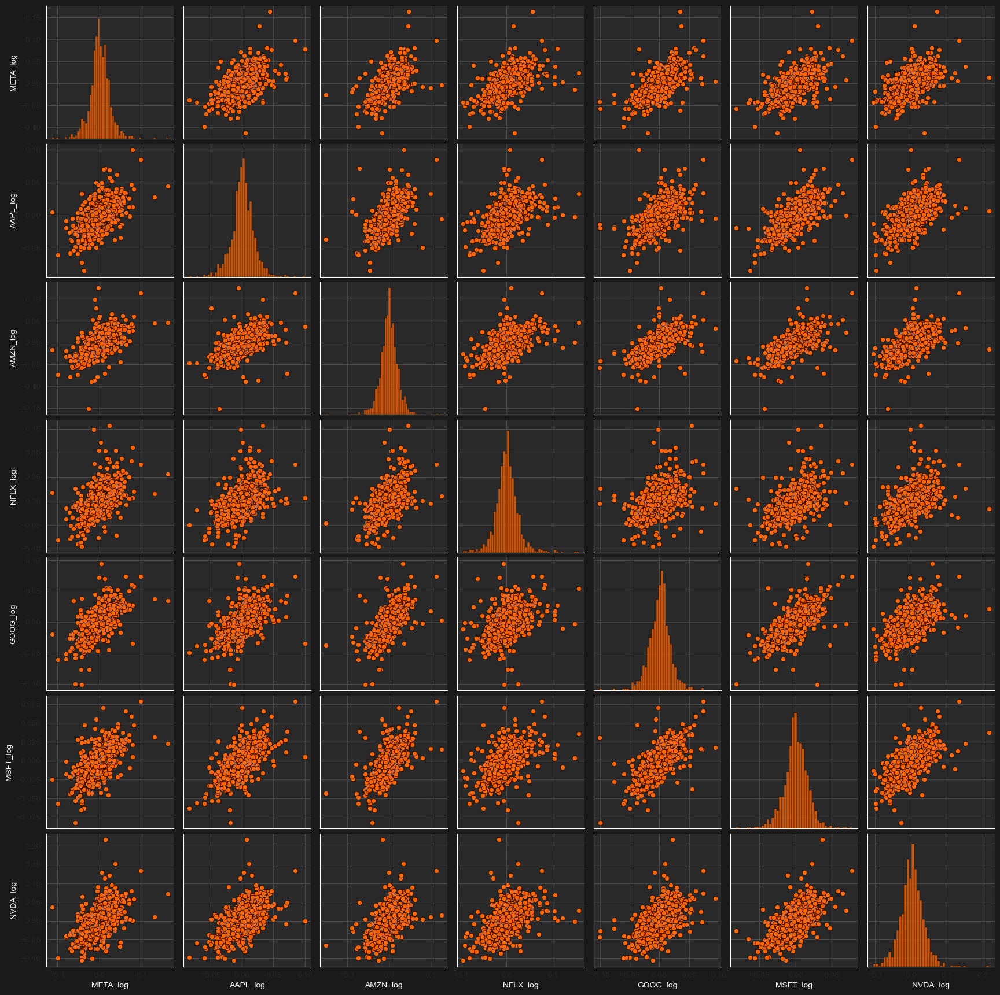

In [4]:
# List of tickers
tickers = list(stock_params.keys())

# Dictionary to hold log returns
log_returns = {}

# Load data and compute log returns
for ticker in tickers:
    df = pd.read_csv(f"case_data/{ticker}.csv", index_col=1, parse_dates=True)
    df[f'{ticker}_log'] = np.log(df['close'] / df['close'].shift(1))
    log_returns[f'{ticker}_log'] = df[f'{ticker}_log']

# Combine into single DataFrame
data = pd.DataFrame(log_returns).dropna()


# Remove extreme outliers 
cutoff = 6 # Key step
data_clean = data[(np.abs(zscore(data)) < cutoff).all(axis=1)] 

z = np.abs(zscore(data))
count = (z > cutoff).sum().sum()
print(f"Values with |zscore| > {cutoff}: {count}") # These most extreme values ruin performance of the model
# Most liekly these are extreme changes due to shocks to one specific stock

# Set up seaborn style for dark mode = ++coolness_factor
sns.set_style("darkgrid", {
    'figure.facecolor': "#1A1A1A",       # background for main plot
    'grid.color': "#494949",             # grid
    'axes.edgecolor': "#ffffff",         # white border 
    'axes.labelcolor': '#ffffff',        # white axis label
    'text.color': '#ffffff',             # white text
    'patch.edgecolor': "#000000",        # edges of histogram bars
})

sns.set_palette(["#ff6600ff"])           # bars and points fill color

# Print out relationships between log returns
g = sns.pairplot(data_clean, plot_kws={'edgecolor': '#000000'}) # edges of points

# Apply panel background to each subplot
for ax in g.axes.flatten():
    if ax:
        ax.set_facecolor("#292929") # dark background for subplots

plt.show()




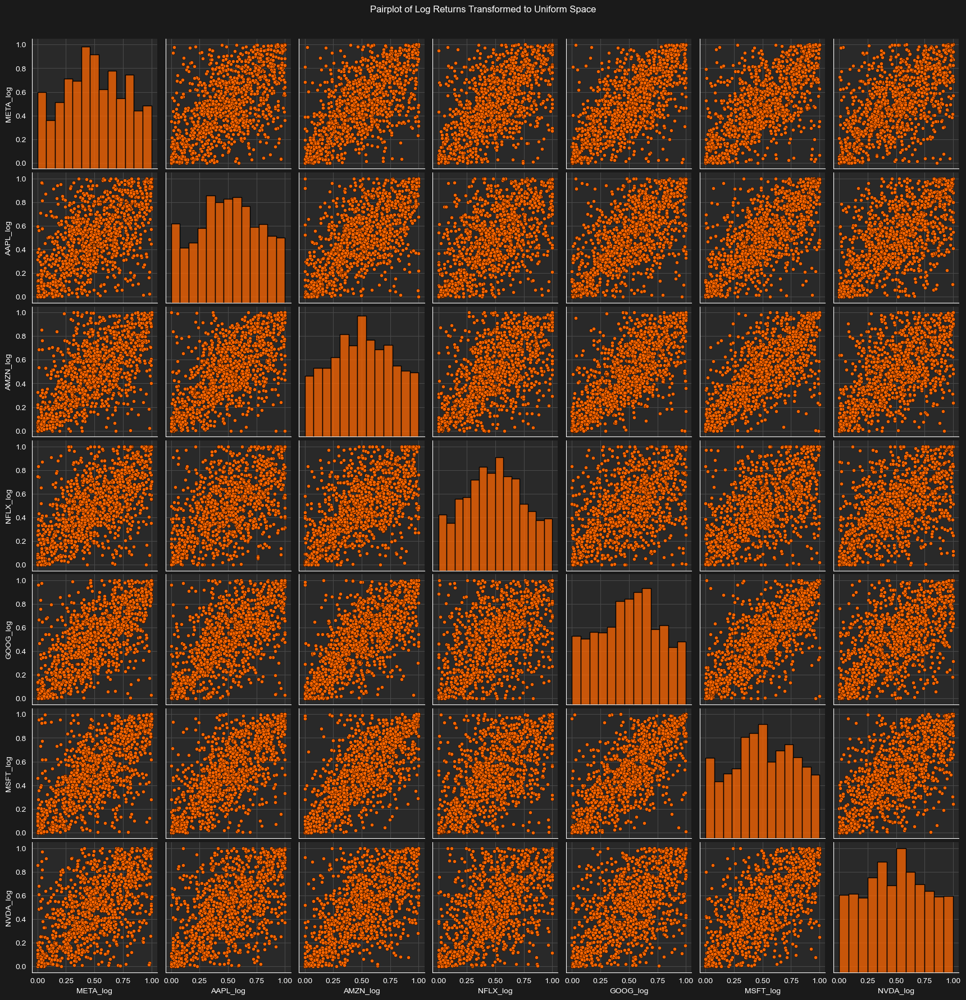

In [5]:

# Transform to uniform space via z-score then norm.cdf
# Removes marginals of each stock return distribution -> Transformation to uniform space
data_uniform = pd.DataFrame(norm.cdf(zscore(data_clean)), columns=data_clean.columns, index=data_clean.index) 

# Set up seaborn style for dark mode
sns.set_style("darkgrid", {
    'figure.facecolor': "#1A1A1A",       # main plot background
    'grid.color': "#494949",             # grid lines
    'axes.edgecolor': "#ffffff",         # axis border
    'axes.labelcolor': '#ffffff',        # axis labels
    'text.color': '#ffffff',             # general text
    'patch.edgecolor': "#000000",        # histogram/bar edges
})

sns.set_palette(["#ff6600ff"])  # orange fill

# Pairplot in uniform space
g_u = sns.pairplot(data_uniform, plot_kws={'edgecolor': '#000000', 's': 20})

# Apply dark background and white elements to subplots
for ax in g_u.axes.flatten():
    if ax:
        ax.set_facecolor("#292929")
        ax.tick_params(colors='white')
        ax.spines[:].set_color('white')

# Add title and figure background
plt.suptitle("Pairplot of Log Returns Transformed to Uniform Space", y=1.02, color='white')
plt.gcf().set_facecolor("#1A1A1A")

plt.show()

Applying GARCH + seeing if it is clustering volatility  

In [6]:
# Note: It was chekcecked if the GARCH(1, 1) model has any effect on modelling. Without it the copula and backtesting is much more erratic.
# GARCH(1, 1) model clusters volatility, which may help in scenarios where a new market price is set, and volatility goes up for consecutive days.

from arch import arch_model

resids = pd.DataFrame()
aic_results = []

for col in data_clean.columns:
    scaled_series = 100 * data_clean[col]  # scale to improve optimization

    # GARCH(1,1) model
    model = arch_model(scaled_series, vol='Garch', p=1, q=1, dist='normal')
    fitted = model.fit(disp='off')
    resids[col] = fitted.resid / fitted.conditional_volatility

    # Constant variance model
    const_model = arch_model(scaled_series, vol='Constant', dist='normal')
    const_fitted = const_model.fit(disp='off')

    # Persistence
    persistence = fitted.params['alpha[1]'] + fitted.params['beta[1]']
    delta_aic = const_fitted.aic - fitted.aic

    # Print tests
    print(f"\n{col} AIC (GARCH):", fitted.aic)
    print(f"{col} AIC (Constant):", const_fitted.aic)
    print(f"{col} ΔAIC (Const - GARCH):", delta_aic)
    print(f"{col} Persistence:", persistence)

    # Store
    aic_results.append({
        'Series': col,
        'GARCH_AIC': fitted.aic,
        'Constant_AIC': const_fitted.aic,
        'Delta_AIC': delta_aic,
        'Persistence': persistence
    })

# Store as DataFrame
aic_df = pd.DataFrame(aic_results)



META_log AIC (GARCH): 4955.68518743019
META_log AIC (Constant): 5045.823459018571
META_log ΔAIC (Const - GARCH): 90.13827158838103
META_log Persistence: 0.9920391795773204

AAPL_log AIC (GARCH): 4264.91936186434
AAPL_log AIC (Constant): 4409.819739340809
AAPL_log ΔAIC (Const - GARCH): 144.90037747646875
AAPL_log Persistence: 0.9870269499663609

AMZN_log AIC (GARCH): 4735.686700495455
AMZN_log AIC (Constant): 4849.416212564444
AMZN_log ΔAIC (Const - GARCH): 113.7295120689896
AMZN_log Persistence: 0.965777461336143

NFLX_log AIC (GARCH): 5103.317770039621
NFLX_log AIC (Constant): 5187.825224186904
NFLX_log ΔAIC (Const - GARCH): 84.50745414728317
NFLX_log Persistence: 0.9921183994751902

GOOG_log AIC (GARCH): 4524.537370083879
GOOG_log AIC (Constant): 4558.568142846768
GOOG_log ΔAIC (Const - GARCH): 34.03077276288877
GOOG_log Persistence: 0.9907781178366661

MSFT_log AIC (GARCH): 4161.031408587491
MSFT_log AIC (Constant): 4256.921735438514
MSFT_log ΔAIC (Const - GARCH): 95.89032685102302

GARCH diagnosis


--- Diagnostics for META_log ---


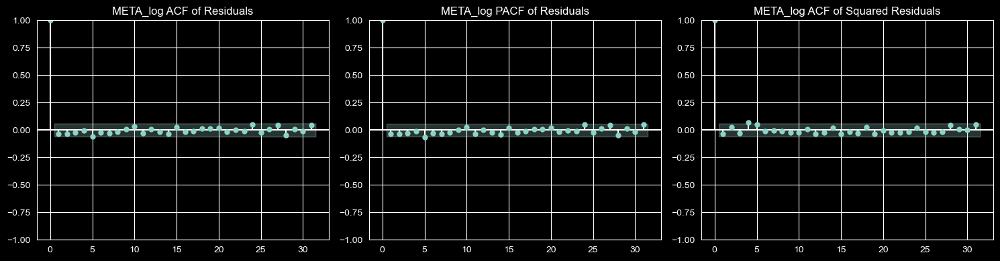

Ljung-Box p-value (residuals): 0.4460693684405791
ARCH test p-value: 0.2732321253379791

--- Diagnostics for AAPL_log ---


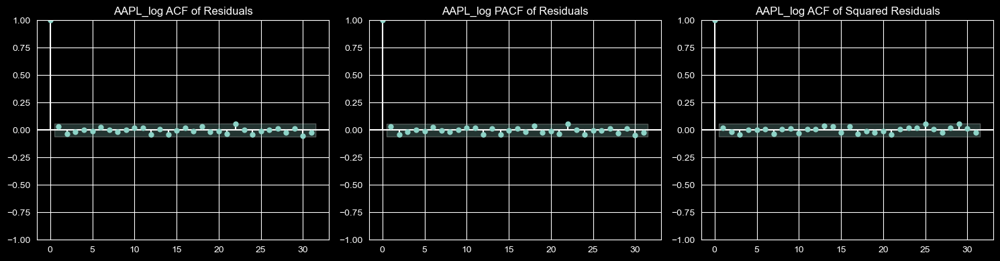

Ljung-Box p-value (residuals): 0.9002748744291889
ARCH test p-value: 0.8830767111315406

--- Diagnostics for AMZN_log ---


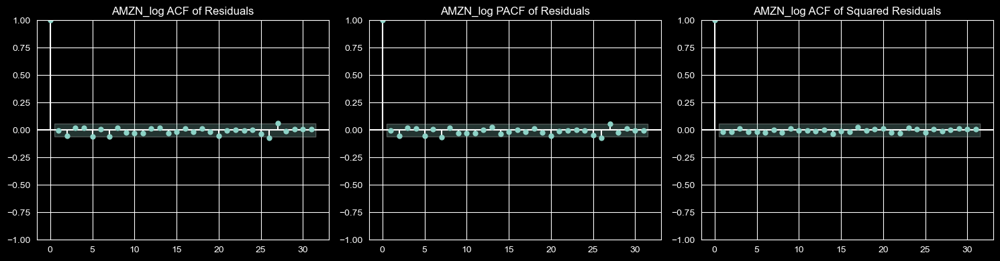

Ljung-Box p-value (residuals): 0.18258111426702914
ARCH test p-value: 0.9790589087478795

--- Diagnostics for NFLX_log ---


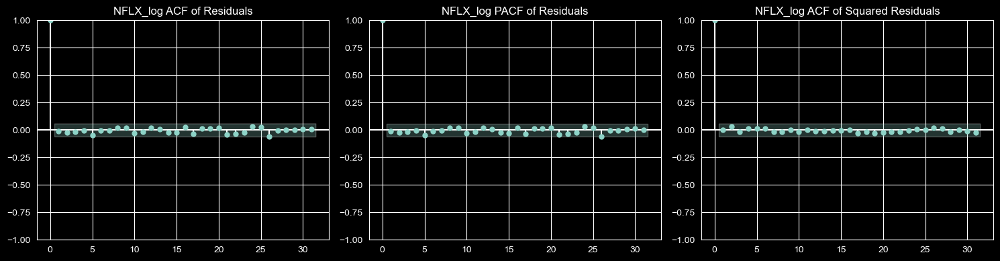

Ljung-Box p-value (residuals): 0.8943997924987087
ARCH test p-value: 0.9860752801021415

--- Diagnostics for GOOG_log ---


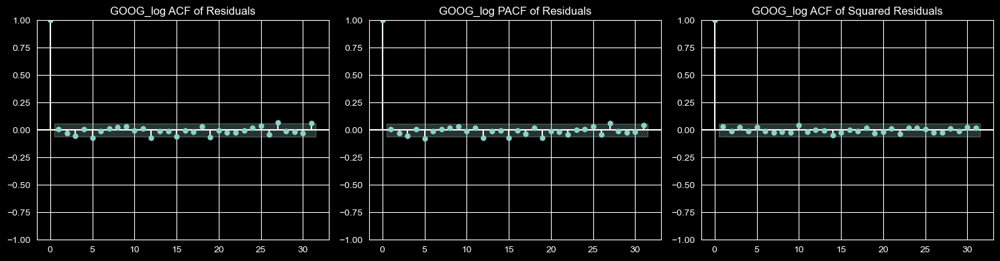

Ljung-Box p-value (residuals): 0.24920474550764388
ARCH test p-value: 0.7118603316992683

--- Diagnostics for MSFT_log ---


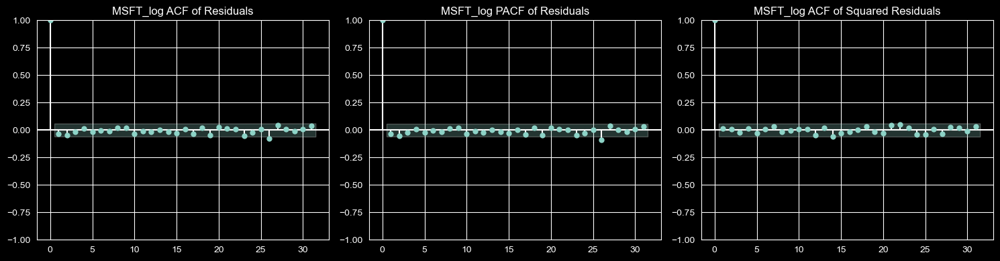

Ljung-Box p-value (residuals): 0.694443587986918
ARCH test p-value: 0.945295517310917

--- Diagnostics for NVDA_log ---


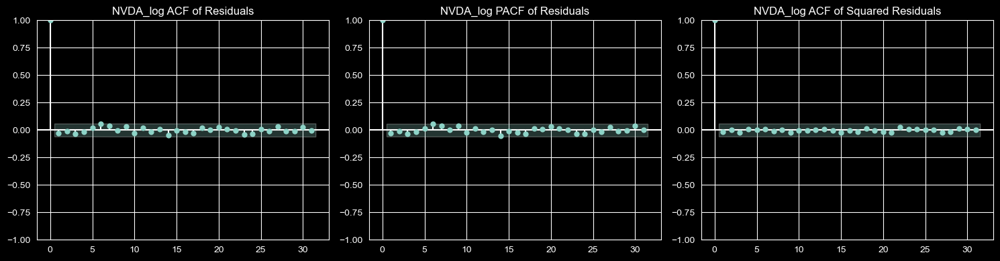

Ljung-Box p-value (residuals): 0.4102099586521981
ARCH test p-value: 0.9971953141763863


In [7]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.stats.diagnostic import acorr_ljungbox, het_arch
import matplotlib.pyplot as plt

plt.style.use('dark_background')  # Dark mode


for col in resids.columns:
    print(f"\n--- Diagnostics for {col} ---")
    
    resid = resids[col].dropna()
    resid_sq = resid ** 2

    # Plot ACF & PACF
    fig, axs = plt.subplots(1, 3, figsize=(15, 4))
    plot_acf(resid, ax=axs[0], title=f'{col} ACF of Residuals')
    plot_pacf(resid, ax=axs[1], title=f'{col} PACF of Residuals')
    plot_acf(resid_sq, ax=axs[2], title=f'{col} ACF of Squared Residuals')
    plt.tight_layout()
    plt.show()

    # Ljung-Box test
    lb_test = acorr_ljungbox(resid, lags=[10], return_df=True)
    print("Ljung-Box p-value (residuals):", lb_test['lb_pvalue'].values[0])

    # ARCH test
    arch_test = het_arch(resid)
    print("ARCH test p-value:", arch_test[1])

# Used to see if any more complexity is needed for the GARCH. (1, 1) seems enough to benefit of GARCH properties, with no further need for more parameters.


Fitting copulas and sampling

c:\Users\anton\.conda\envs\algo-trading\Lib\site-packages\scipy\stats\_continuous_distns.py:795: RuntimeWarning: invalid value encountered in sqrt
  sk = 2*(b-a)*np.sqrt(a + b + 1) / (a + b + 2) / np.sqrt(a*b)
c:\Users\anton\.conda\envs\algo-trading\Lib\site-packages\scipy\stats\_continuous_distns.py:800: RuntimeWarning: The iteration is not making good progress, as measured by the 
 improvement from the last ten iterations.
  a, b = optimize.fsolve(func, (1.0, 1.0))
c:\Users\anton\.conda\envs\algo-trading\Lib\site-packages\scipy\stats\_continuous_distns.py:795: RuntimeWarning: invalid value encountered in sqrt
  sk = 2*(b-a)*np.sqrt(a + b + 1) / (a + b + 2) / np.sqrt(a*b)
c:\Users\anton\.conda\envs\algo-trading\Lib\site-packages\scipy\stats\_continuous_distns.py:800: RuntimeWarning: The iteration is not making good progress, as measured by the 
 improvement from the last ten iterations.
  a, b = optimize.fsolve(func, (1.0, 1.0))
c:\Users\anton\.conda\envs\algo-trading\Lib\site-package

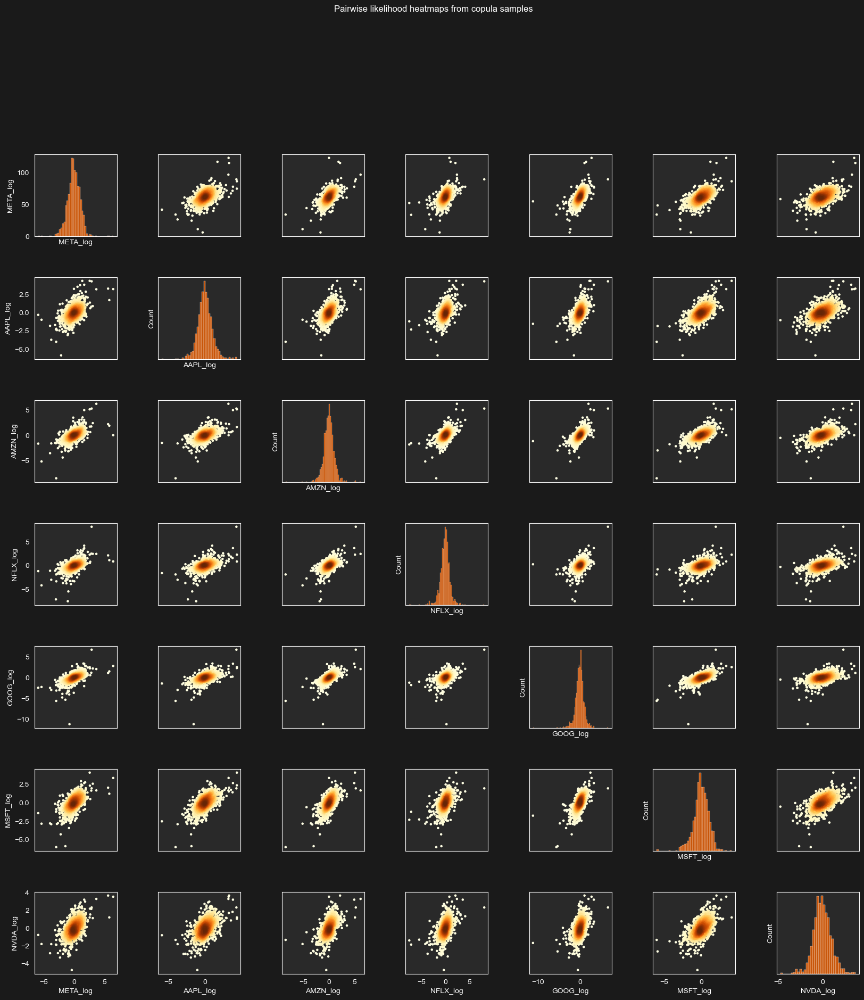

In [8]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from scipy.stats import gaussian_kde

# Fit a Gaussian copula to the residuals
copula = GaussianMultivariate()
copula.fit(resids)

# Generate samples from the copula
samples = copula.sample(len(resids))
samples_df = pd.DataFrame(samples, columns=resids.columns)
vars = samples_df.columns

fig, axes = plt.subplots(len(vars), len(vars), figsize=(20, 20))
fig.patch.set_facecolor("#1A1A1A")
plt.subplots_adjust(hspace=0.5, wspace=0.5)

for i, var1 in enumerate(vars):
    for j, var2 in enumerate(vars):
        ax = axes[i, j]
        ax.set_facecolor("#292929")
        if i == j:
            sns.histplot(samples_df[var1], kde=False, ax=ax, color="#ff6600")
            ax.grid(False)  # grid on diagonal
        else:
            x = samples_df[var2]
            y = samples_df[var1]
            xy = np.vstack([x, y])
            z = gaussian_kde(xy)(xy)
            idx = z.argsort()
            x, y, z = x.iloc[idx], y.iloc[idx], z[idx]
            ax.scatter(x, y, c=z, cmap="YlOrBr", s=5)
            ax.grid(False)  # no grid off diagonal
        
        ax.tick_params(colors='white')
        ax.spines[:].set_color('white')
        if i == len(vars) - 1:
            ax.set_xlabel(var2, color='white')
        else:
            ax.set_xticks([])
        if j == 0:
            ax.set_ylabel(var1, color='white')
        else:
            ax.set_yticks([])

# Same plot as above, but samples from the fit copula, making sure it looks right, with the addition of likelihoods involved
# Note: eahc plot is a slice of the 7-dimentional model
plt.suptitle("Pairwise likelihood heatmaps from copula samples", y=1.02, color='white')
plt.show()



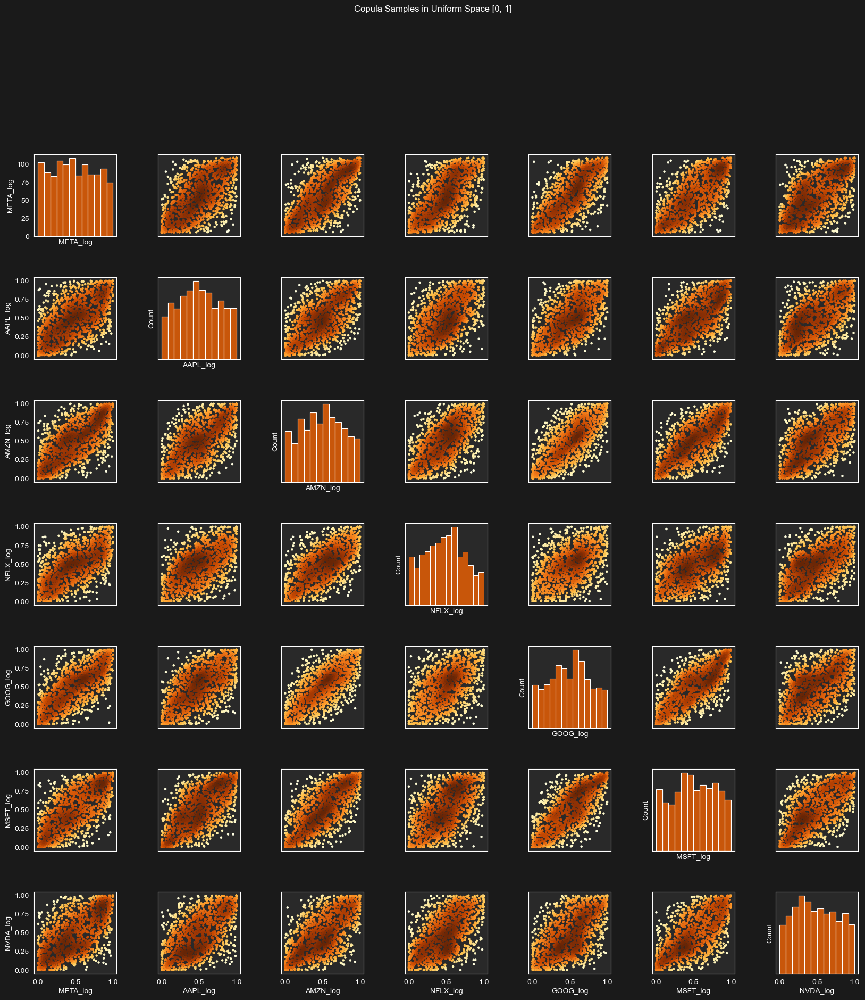

In [9]:
# Transform to uniform space
samples_uniform_df = pd.DataFrame(norm.cdf(samples_df), columns=vars)

# Create plot in uniform space
fig, axes = plt.subplots(len(vars), len(vars), figsize=(20, 20))
fig.patch.set_facecolor("#1A1A1A")
plt.subplots_adjust(hspace=0.5, wspace=0.5)

for i, var1 in enumerate(vars):
    for j, var2 in enumerate(vars):
        ax = axes[i, j]
        ax.set_facecolor("#292929")
        if i == j:
            sns.histplot(samples_uniform_df[var1], kde=False, ax=ax, color="#ff6600")
            ax.grid(False)
        else:
            x = samples_uniform_df[var2]
            y = samples_uniform_df[var1]
            xy = np.vstack([x, y])
            z = gaussian_kde(xy)(xy)
            idx = z.argsort()
            x, y, z = x.iloc[idx], y.iloc[idx], z[idx]
            ax.scatter(x, y, c=z, cmap="YlOrBr", s=5)
            ax.grid(False)

        ax.tick_params(colors='white')
        ax.spines[:].set_color('white')
        if i == len(vars) - 1:
            ax.set_xlabel(var2, color='white')
        else:
            ax.set_xticks([])
        if j == 0:
            ax.set_ylabel(var1, color='white')
        else:
            ax.set_yticks([])


plt.suptitle("Copula Samples in Uniform Space [0, 1]", y=1.02, color='white')
plt.show()

# Uniform space shows the  dependency stucture nicely with the likelihood heatmaps
# I am the most porud of these plots, they confim the copulas have uncovered something more than a simple multivariate normal distribution could


Generating singals and backtesting for each asset, based on the individual state compaerd to the other assets

In [ ]:
# List of tickers
# tickers = list(stock_params.keys()) # Unused, defined above


signals_dict = {}

# Transform residuals to uniform marginals
resids_uniform = pd.DataFrame(norm.cdf(resids), columns=resids.columns, index=resids.index)

# --- Defining an extreme event based on likelihoods ---
# Joint likelihoods (for multivariate analysis)
likelihoods = copula.probability_density(resids_uniform)

# Compute lower and upper thresholds
lower_thresh = np.percentile(likelihoods, 0)
upper_thresh = np.percentile(likelihoods, 30)

# Define extreme days between 5th and 25th percentile
extreme_days = (likelihoods >= lower_thresh) & (likelihoods < upper_thresh)
# --- --- --- --- --- ---

# Generate signals based on extreme residuals for eac hasset
for asset in stock_params.keys():
    resid_col = f"{asset}_log"   # map asset name to residuals column
    signals = pd.Series(index=resids.index, dtype=object)
    extreme_resid = resids[resid_col][extreme_days]
    signals.loc[extreme_resid.index] = np.where(extreme_resid < 0, 'buy', 'sell')
    signals.fillna('hold', inplace=True)
    signals_dict[asset] = signals
   # print(signals_dict[list(signals_dict.keys())[0]].head(10))


# VectorBT backtesting
portfolios = {}
for asset in tickers:
    price_df = pd.read_csv(f"case_data/{asset}.csv", index_col=1, parse_dates=True)['close']
    
    entries = signals_dict[asset] == 'buy'
    exits = signals_dict[asset] == 'sell'
    
    # Align price with signal index
    price_df = price_df.reindex(entries.index)
    
    pf = vbt.Portfolio.from_signals(
        price_df,
        entries,
        exits,
        call_seq='auto',
        init_cash=100000,
        fees=0.001,
        slippage=0.0002,
        freq='1D'
    )
    
    portfolios[asset] = pf
    print(f"{asset} stats:\n", pf.stats())
    pf.plot(template='plotly_dark').show()
    pf.drawdowns.plot(template='plotly_dark').show()

# Note: Some results metrics are not representative due to trades being open during a stock split



META stats:
 Start                         2020-07-28 04:00:00+00:00
End                           2024-12-31 05:00:00+00:00
Period                               1104 days 00:00:00
Start Value                                    100000.0
End Value                                  235764.93221
Total Return [%]                             135.764932
Benchmark Return [%]                         154.691304
Max Gross Exposure [%]                            100.0
Total Fees Paid                             23190.08584
Max Drawdown [%]                              20.571126
Max Drawdown Duration                 576 days 00:00:00
Total Trades                                         61
Total Closed Trades                                  61
Total Open Trades                                     0
Open Trade PnL                                      0.0
Win Rate [%]                                  63.934426
Best Trade [%]                                17.389129
Worst Trade [%]                    

AAPL stats:
 Start                         2020-07-28 04:00:00+00:00
End                           2024-12-31 05:00:00+00:00
Period                               1104 days 00:00:00
Start Value                                    100000.0
End Value                                 129348.616085
Total Return [%]                              29.348616
Benchmark Return [%]                         -32.863957
Max Gross Exposure [%]                            100.0
Total Fees Paid                            16057.468589
Max Drawdown [%]                              18.131804
Max Drawdown Duration                 257 days 00:00:00
Total Trades                                         66
Total Closed Trades                                  66
Total Open Trades                                     0
Open Trade PnL                                      0.0
Win Rate [%]                                  59.090909
Best Trade [%]                                12.066166
Worst Trade [%]                    

AMZN stats:
 Start                         2020-07-28 04:00:00+00:00
End                           2024-12-31 05:00:00+00:00
Period                               1104 days 00:00:00
Start Value                                    100000.0
End Value                                 126003.727411
Total Return [%]                              26.003727
Benchmark Return [%]                          -92.68487
Max Gross Exposure [%]                            100.0
Total Fees Paid                             14710.04852
Max Drawdown [%]                              32.033756
Max Drawdown Duration                 747 days 00:00:00
Total Trades                                         63
Total Closed Trades                                  63
Total Open Trades                                     0
Open Trade PnL                                      0.0
Win Rate [%]                                  63.492063
Best Trade [%]                                11.804927
Worst Trade [%]                    

NFLX stats:
 Start                         2020-07-28 04:00:00+00:00
End                           2024-12-31 05:00:00+00:00
Period                               1104 days 00:00:00
Start Value                                    100000.0
End Value                                  64676.026389
Total Return [%]                             -35.323974
Benchmark Return [%]                          82.710788
Max Gross Exposure [%]                            100.0
Total Fees Paid                             7522.154696
Max Drawdown [%]                              56.877086
Max Drawdown Duration                1079 days 00:00:00
Total Trades                                         53
Total Closed Trades                                  53
Total Open Trades                                     0
Open Trade PnL                                      0.0
Win Rate [%]                                  62.264151
Best Trade [%]                                 11.41584
Worst Trade [%]                    

GOOG stats:
 Start                         2020-07-28 04:00:00+00:00
End                           2024-12-31 05:00:00+00:00
Period                               1104 days 00:00:00
Start Value                                    100000.0
End Value                                 201351.298739
Total Return [%]                             101.351299
Benchmark Return [%]                         -87.313597
Max Gross Exposure [%]                            100.0
Total Fees Paid                            19568.439289
Max Drawdown [%]                              10.436926
Max Drawdown Duration                 113 days 00:00:00
Total Trades                                         66
Total Closed Trades                                  66
Total Open Trades                                     0
Open Trade PnL                                      0.0
Win Rate [%]                                  74.242424
Best Trade [%]                                 9.653754
Worst Trade [%]                    

MSFT stats:
 Start                         2020-07-28 04:00:00+00:00
End                           2024-12-31 05:00:00+00:00
Period                               1104 days 00:00:00
Start Value                                    100000.0
End Value                                 134553.784179
Total Return [%]                              34.553784
Benchmark Return [%]                          108.60747
Max Gross Exposure [%]                            100.0
Total Fees Paid                            17538.951769
Max Drawdown [%]                              13.964513
Max Drawdown Duration                 210 days 00:00:00
Total Trades                                         73
Total Closed Trades                                  73
Total Open Trades                                     0
Open Trade PnL                                      0.0
Win Rate [%]                                  69.863014
Best Trade [%]                                 7.892741
Worst Trade [%]                    

NVDA stats:
 Start                         2020-07-28 04:00:00+00:00
End                           2024-12-31 05:00:00+00:00
Period                               1104 days 00:00:00
Start Value                                    100000.0
End Value                                 385257.382939
Total Return [%]                             285.257383
Benchmark Return [%]                           -67.2035
Max Gross Exposure [%]                            100.0
Total Fees Paid                            35062.022144
Max Drawdown [%]                              19.041611
Max Drawdown Duration                 190 days 00:00:00
Total Trades                                         68
Total Closed Trades                                  68
Total Open Trades                                     0
Open Trade PnL                                      0.0
Win Rate [%]                                  64.705882
Best Trade [%]                                23.987862
Worst Trade [%]                    

Looping through extreme event likelihood definition, and plotting end value of trades.

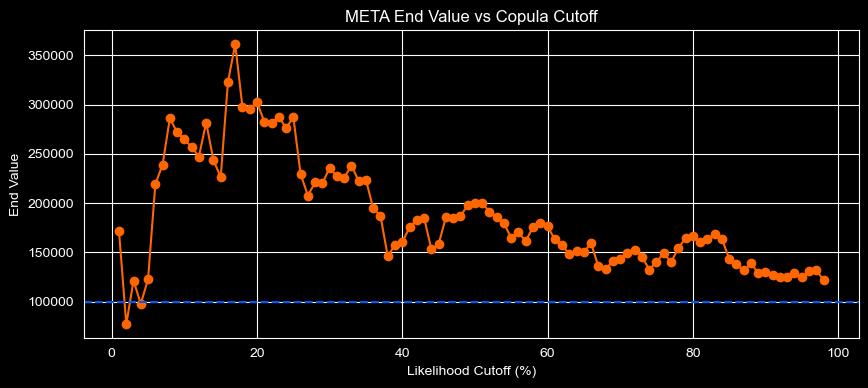

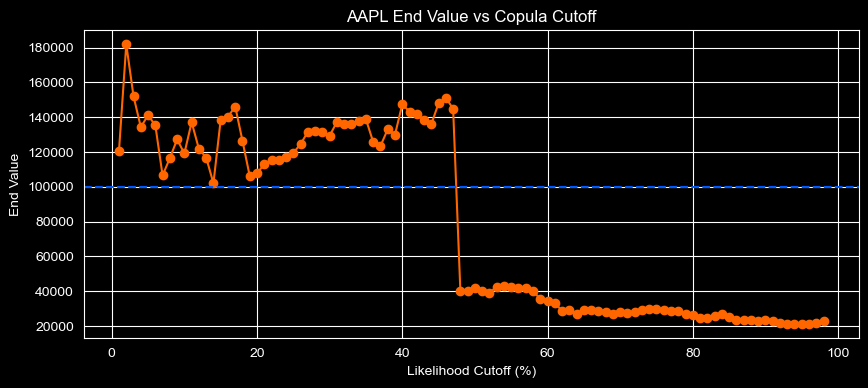

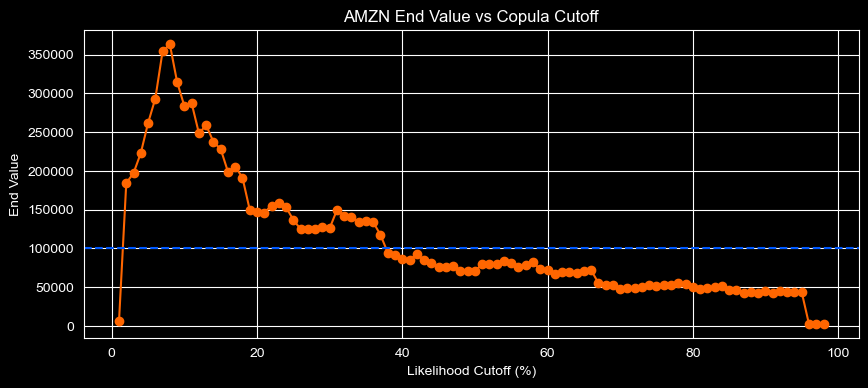

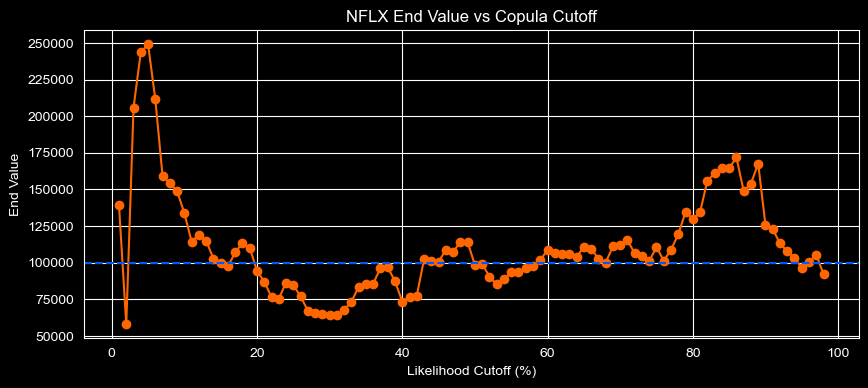

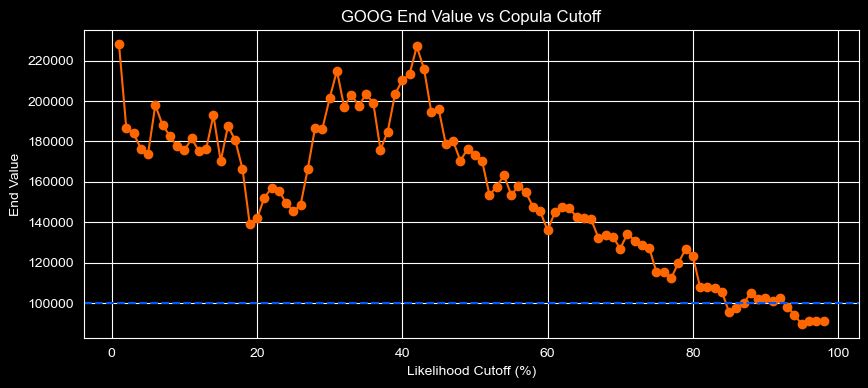

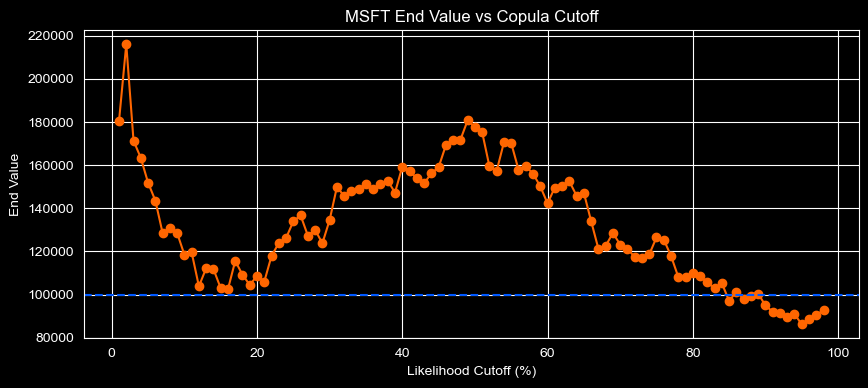

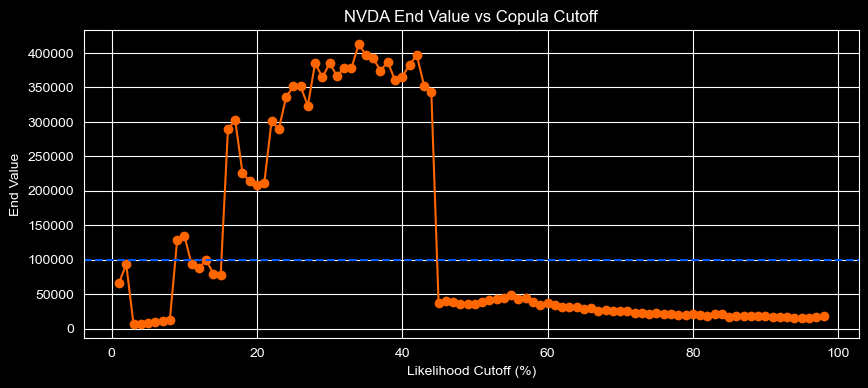

In [11]:
threshold_range = range(1, 99, 1)
results = {asset: [] for asset in tickers}

for cutoff in threshold_range:
    lower_thresh = np.percentile(likelihoods, 0)
    upper_thresh = np.percentile(likelihoods, cutoff)
    extreme_days = (likelihoods >= lower_thresh) & (likelihoods < upper_thresh)

    signals_dict = {}
    for asset in stock_params.keys():
        resid_col = f"{asset}_log"
        signals = pd.Series(index=resids.index, dtype=object)
        extreme_resid = resids[resid_col][extreme_days]
        signals.loc[extreme_resid.index] = np.where(extreme_resid < 0, 'buy', 'sell')
        signals.fillna('hold', inplace=True)
        signals_dict[asset] = signals

    for asset in tickers:
        price_df = pd.read_csv(f"case_data/{asset}.csv", index_col=1, parse_dates=True)['close']
        price_df = price_df.reindex(signals_dict[asset].index)

        entries = signals_dict[asset] == 'buy'
        exits = signals_dict[asset] == 'sell'

        pf = vbt.Portfolio.from_signals(
            price_df,
            entries,
            exits,
            call_seq='auto',
            init_cash=100000,
            fees=0.001,
            slippage=0.0002,
            freq='1D'
        )
        results[asset].append(pf.stats()["End Value"])

# Plotting end value
for asset in tickers:
    plt.style.use('dark_background')
    plt.figure(figsize=(10, 4))
    plt.plot(threshold_range, results[asset], marker='o', color='#ff6600')
    plt.axhline(y=100000, color="#0059ff", linestyle='--')  # Horizontal line
    plt.title(f"{asset} End Value vs Copula Cutoff")
    plt.xlabel("Likelihood Cutoff (%)")
    plt.ylabel("End Value")
    plt.grid(True)
    plt.show()

# Interesting obserevation from plotting many metrics, the end value is highly correlated to the sharepe ratio of the se likelihood cuttoffs. 
